# Analysis of EV sales in Washington state of USA

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina', quality=100)

In [4]:
import matplotlib.pyplot as plt
print(plt.rcParams['font.family'])

['sans-serif']


In [5]:
usa_ev=pd.read_csv('USA Electric_Vehicle_Population_Data.csv')

In [6]:
usa_ev.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,5YJ3E1EB4L,Yakima,Yakima,WA,98908.0,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,322,0,14.0,127175366,POINT (-120.56916 46.58514),PACIFICORP,5.307700e+10
1,5YJ3E1EA7K,San Diego,San Diego,CA,92101.0,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220,0,NaN,266614659,POINT (-117.16171 32.71568),NaN,6.073005e+09
2,7JRBR0FL9M,Lane,Eugene,OR,97404.0,2021,VOLVO,S60,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,22,0,NaN,144502018,POINT (-123.12802 44.09573),NaN,4.103900e+10
3,5YJXCBE21K,Yakima,Yakima,WA,98908.0,2019,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,289,0,14.0,477039944,POINT (-120.56916 46.58514),PACIFICORP,5.307700e+10
4,5UXKT0C5XH,Snohomish,Bothell,WA,98021.0,2017,BMW,X5,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,14,0,1.0,106314946,POINT (-122.18384 47.8031),PUGET SOUND ENERGY INC,5.306105e+10


In [7]:
# Dropping vehicle identification number and other columns because they are not needed.
usa_ev.drop(['VIN (1-10)','Postal Code','Base MSRP','DOL Vehicle ID','Legislative District','Vehicle Location','2020 Census Tract'],axis=1,inplace=True)

In [8]:
usa_ev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124716 entries, 0 to 124715
Data columns (total 10 columns):
 #   Column                                             Non-Null Count   Dtype 
---  ------                                             --------------   ----- 
 0   County                                             124714 non-null  object
 1   City                                               124714 non-null  object
 2   State                                              124716 non-null  object
 3   Model Year                                         124716 non-null  int64 
 4   Make                                               124716 non-null  object
 5   Model                                              124535 non-null  object
 6   Electric Vehicle Type                              124716 non-null  object
 7   Clean Alternative Fuel Vehicle (CAFV) Eligibility  124716 non-null  object
 8   Electric Range                                     124716 non-null  int64 
 9   Elec

In [9]:
usa_ev.isnull().sum()

County                                                 2
City                                                   2
State                                                  0
Model Year                                             0
Make                                                   0
Model                                                181
Electric Vehicle Type                                  0
Clean Alternative Fuel Vehicle (CAFV) Eligibility      0
Electric Range                                         0
Electric Utility                                     473
dtype: int64

In [10]:
usa_ev.shape

(124716, 10)

In [11]:
# Droping rows with null values
usa_ev.dropna(inplace=True)

In [12]:
usa_ev.shape

(124062, 10)

In [13]:
usa_ev.isnull().sum()

County                                               0
City                                                 0
State                                                0
Model Year                                           0
Make                                                 0
Model                                                0
Electric Vehicle Type                                0
Clean Alternative Fuel Vehicle (CAFV) Eligibility    0
Electric Range                                       0
Electric Utility                                     0
dtype: int64

In [14]:
usa_ev.describe()

,Model Year,Electric Range
count,124062.000000,124062.000000
mean,2019.402355,79.569772
std,2.975476,100.346310
min,1997.000000,0.000000
25%,2018.000000,0.000000
50%,2020.000000,25.000000
75%,2022.000000,200.000000
max,2023.000000,337.000000


In [15]:
usa_ev.nunique()

County                                                39
City                                                 447
State                                                  1
Model Year                                            21
Make                                                  35
Model                                                120
Electric Vehicle Type                                  2
Clean Alternative Fuel Vehicle (CAFV) Eligibility      3
Electric Range                                       101
Electric Utility                                      73
dtype: int64

In [16]:
usa_ev['Electric Vehicle Type'].unique()

array(['Battery Electric Vehicle (BEV)',
       'Plug-in Hybrid Electric Vehicle (PHEV)'], dtype=object)

# Data Analysis and Visualization 

In [17]:
# Different Color Sets
colour1=['#A8E6CE','#DCEDC2','#FFD3B5','#FFAAA6','#FF8C94']
colour2=['#E1F5C4','#EDE574','#F9D423','#FC913A','#FF4E50']
colour3=['#f9d5e5','#eeac99','#e06377','#c83349','#5b9aa0','#d6d4e0','#b8a9c9','#622569'] # 8 colours
colour4=['#e6194b','#3cb44b','#ffe119','#4363d8','#f58231','#911eb4','#46f0f0','#f032e6','#bcf60c','#fabebe',
'#008080','#e6beff','#9a6324','#fffac8','#800000','#aaffc3','#808000','#ffd8b1','#000075','#808080','#ffffff','#000000']
colour5=['#FF8000', '#E34234', '#F28500', '#FF7F50', '#FBCEB1', '#FFBF00', '#FFE5B4', '#FF7900', '#F4C430', '#FF7518',
         '#B7410E', '#FEBA4F', '#F89880', '#FA8072', '#E97451', '#CC7722', '#F04A00']
colour6=['#beb9bb', '#6b4e55','#f2eaec','#f7f8d8','#f2e095','#f1c296','#c8a67c','#ff9fac','#77736f']
# Tones of Torquise colour
colour7=['#f4fdfb', '#edfbf9', '#e6faf7', '#e0f9f4', '#d9f8f2', '#d2f6f0', '#cbf5ed', '#c4f4eb', '#bdf2e9', '#b6f1e7', '#aff0e4',
         '#a8efe2', '#a2ede0', '#9becdd', '#94ebdb', '#8dead9', '#86e8d7', '#7fe7d4', '#78e6d2', '#71e4d0', '#6ae3cd', '#64e2cb',
         '#5de1c9', '#56dfc7', '#4fdec4', '#48ddc2', '#41dcc0', '#3adabd', '#33d9bb', '#2cd8b9', '#27d5b6', '#26ceb0', '#24c7aa',
         '#23c0a4', '#22b99e', '#21b398', '#1fac92', '#1ea58d', '#1d9e87', '#1b9781', '#1a907b', '#198975', '#18826f', '#167b69',
         '#157563', '#146e5e', '#136758', '#116052', '#10594c', '#0f5246', '#0d4b40', '#0c443a', '#0b3d34', '#0a372f', '#083029',
         '#072923', '#06221d', '#051b17', '#031411', '#020d0b']
colour8 = ['#46ddc2', '#47dcc1', '#4cd7be', '#50d3bb', '#54cfb9', '#59cab6', '#5dc6b3', '#62c1b0', '#66bdad', '#6ab9ab', '#6fb4a8',
           '#73b0a5', '#77aca2', '#7ca79f', '#80a39d', '#849f9a', '#899a97', '#8d9694', '#929292']
colour9 = ['#056970', '#a7e3e8', '#bcfaff', '#0b8189', '#95f3f9', '#35a5ad', '#5dbbc1', '#7eced3', '#279199', '#17879e', '#257282', '#73dff4', '#4ecee8', '#31bad6', '#65c1d3', '#a1d5e0', '#056072', '#bae8f2', '#5fafbf', '#014e5e', '#459dad']
# Pink Blue Light Shades
colour10=['#c0defa','#c4f1b1','#ffef99','#ffb6cb','#cbb1f4']
# Light Green Shades
green = ['#66ea83', '#6ae684', '#6de386', '#71df88', '#74dc8a', '#78d88c', '#7bd58e', '#7ed290', '#82ce92', '#85cb94', '#89c796', '#8cc498', '#90c09a', '#93bd9c', '#97b99e', '#9ab6a0', '#9eb2a2', '#a1afa4', '#a5aba6', '#a8a8a8']
        

colors = ['#f7ecb0', '#ffb3e6', '#99ff99', '#66b3ff', '#c7b3fb','#ff6666', '#f9c3b7']
    

In [18]:
ev_type=usa_ev.groupby('Electric Vehicle Type').size().reset_index(name='Sales')
ev_type

,Electric Vehicle Type,Sales
0,Battery Electric Vehicle (BEV),95772
1,Plug-in Hybrid Electric Vehicle (PHEV),28290


# There are two types of electric vehicles available in the american market. 

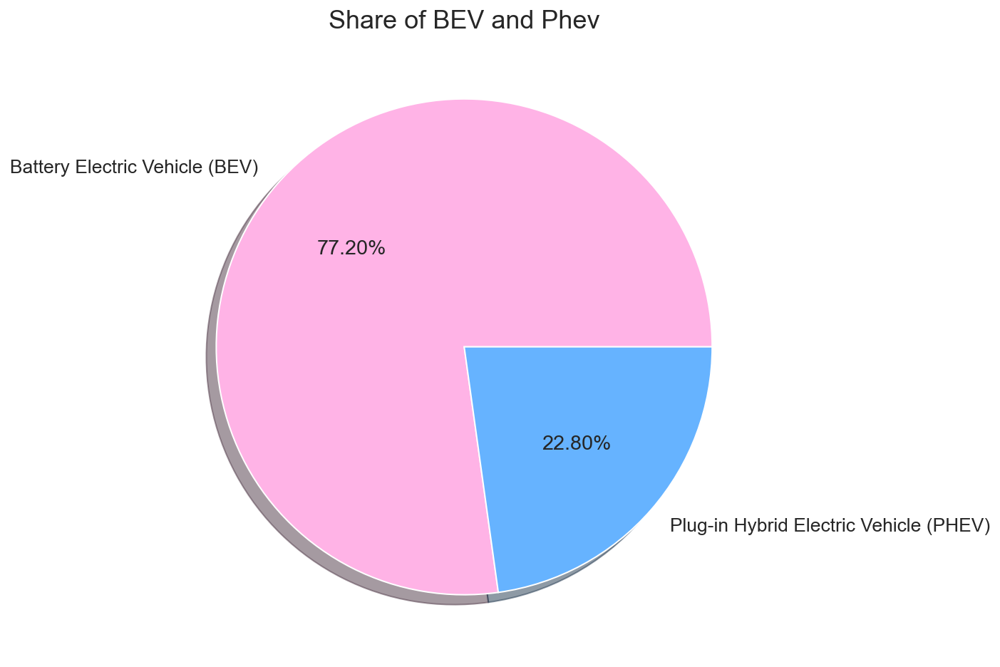

In [19]:
labels = ev_type['Electric Vehicle Type']
sizes = ev_type['Sales']
sns.set(font_scale = 1.2)
plt.figure(figsize=(8,8))
plt.pie(
    x=sizes, 
    labels=labels,
    autopct='%1.2f%%',
    shadow=True,
    colors=['#ffb3e6','#66b3ff']
)
plt.title('Share of BEV and Phev', y=1, fontsize=18)
plt.show()


# Conclusion: BEV is much more popular among EV customers

In [20]:
usa_ev['Car_Name']=usa_ev['Make'].str.cat(usa_ev['Model'],sep=' ')
usa_ev.head()

,County,City,State,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Electric Utility,Car_Name
0,Yakima,Yakima,WA,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,322,PACIFICORP,TESLA MODEL 3
3,Yakima,Yakima,WA,2019,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,289,PACIFICORP,TESLA MODEL X
4,Snohomish,Bothell,WA,2017,BMW,X5,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,14,PUGET SOUND ENERGY INC,BMW X5
5,Snohomish,Everett,WA,2015,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84,PUGET SOUND ENERGY INC,NISSAN LEAF
6,Kitsap,Poulsbo,WA,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,PUGET SOUND ENERGY INC,TESLA MODEL 3


In [21]:
# Filter the data to only include entries for BEV
bev_df = usa_ev[usa_ev['Electric Vehicle Type'] == 'Battery Electric Vehicle (BEV)']
bev_df.head()

,County,City,State,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Electric Utility,Car_Name
0,Yakima,Yakima,WA,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,322,PACIFICORP,TESLA MODEL 3
3,Yakima,Yakima,WA,2019,TESLA,MODEL X,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,289,PACIFICORP,TESLA MODEL X
5,Snohomish,Everett,WA,2015,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,84,PUGET SOUND ENERGY INC,NISSAN LEAF
6,Kitsap,Poulsbo,WA,2018,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,215,PUGET SOUND ENERGY INC,TESLA MODEL 3
8,Kitsap,Port Orchard,WA,2013,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,75,PUGET SOUND ENERGY INC,NISSAN LEAF


In [22]:
# Dropping Electric Vehicle Type column because it only contains Battery Electric Vehicle (BEV) now.
bev_df.drop(['Electric Vehicle Type'],axis=1,inplace=True)

In [23]:
bev_df.head()

,County,City,State,Model Year,Make,Model,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Electric Utility,Car_Name
0,Yakima,Yakima,WA,2020,TESLA,MODEL 3,Clean Alternative Fuel Vehicle Eligible,322,PACIFICORP,TESLA MODEL 3
3,Yakima,Yakima,WA,2019,TESLA,MODEL X,Clean Alternative Fuel Vehicle Eligible,289,PACIFICORP,TESLA MODEL X
5,Snohomish,Everett,WA,2015,NISSAN,LEAF,Clean Alternative Fuel Vehicle Eligible,84,PUGET SOUND ENERGY INC,NISSAN LEAF
6,Kitsap,Poulsbo,WA,2018,TESLA,MODEL 3,Clean Alternative Fuel Vehicle Eligible,215,PUGET SOUND ENERGY INC,TESLA MODEL 3
8,Kitsap,Port Orchard,WA,2013,NISSAN,LEAF,Clean Alternative Fuel Vehicle Eligible,75,PUGET SOUND ENERGY INC,NISSAN LEAF


In [24]:
bev_df.shape

(95772, 10)

In [25]:
# There are total 63 bev models
bev_df['Car_Name'].nunique()

63

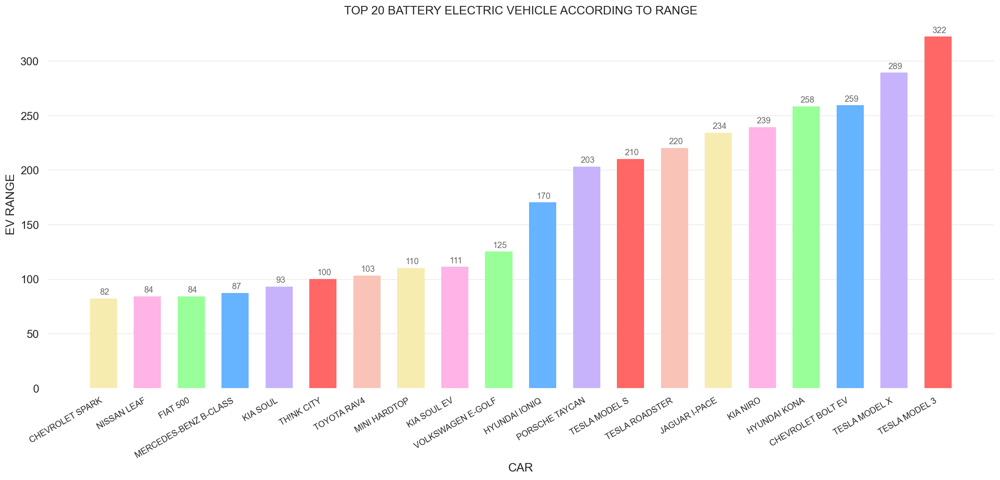

In [26]:
top20 = bev_df.drop_duplicates(subset='Car_Name').nlargest(20, 'Electric Range')
top20.sort_values('Electric Range',ascending=True,inplace=True)
plt.rcParams['figure.figsize'] = (20, 8)

def autolabel(rectangle_group):
    for rect in rectangle_group:
        height=rect.get_height()
        ax.annotate(str(height),
                    xy=(rect.get_x()+rect.get_width()/2,height),
                    ha='center',
                    xytext=(1.5,5),
                    textcoords='offset points',
                    color='dimgrey',
                    fontsize=10)

width = 0.6
fig,ax = plt.subplots()
rect1 = ax.bar(top20['Car_Name'], top20['Electric Range'], width, 
               color=colors, edgecolor=colors, tick_label=top20['Car_Name'])
autolabel(rect1)
ax.set_title('TOP 20 BATTERY ELECTRIC VEHICLE ACCORDING TO RANGE',fontsize=14)
ax.set_xlabel('CAR',fontsize=14)
ax.set_ylabel('EV RANGE',fontsize=14)
ax.yaxis.grid(True, color='#EEEEEE')
ax.set_facecolor('white')
ax.xaxis.grid(False)
# Adjust the horizontal alignment of tick labels to the right
ax.set_xticklabels(top20['Car_Name'],ha='right',fontsize=10)
plt.xticks(rotation=30)
plt.show()
plt.show()


# Conclusion: TESLA MODEL 3 provides the best range among all the BEV, followed by TESLA MODEL X.

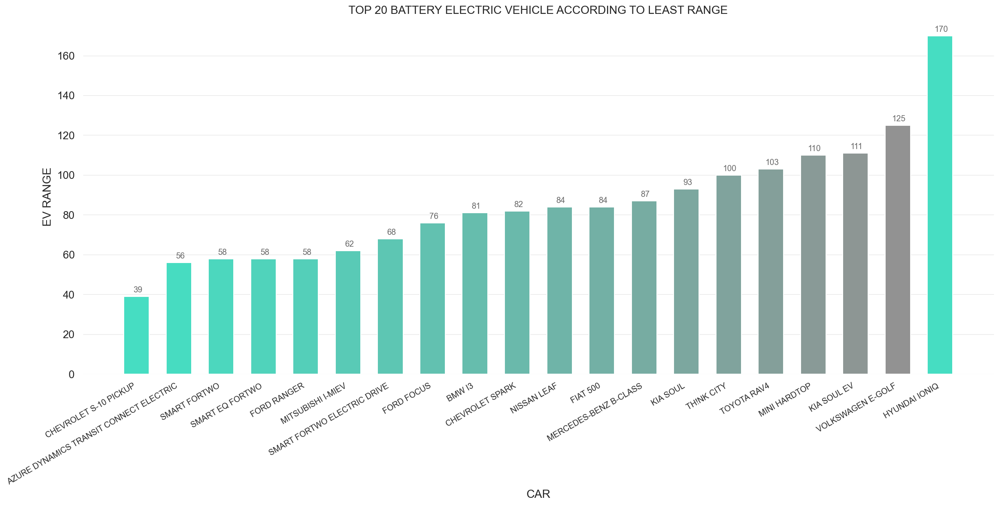

In [27]:
# Copying only those values which do not have a range of 0.
least20=bev_df[bev_df['Electric Range']!=0]
least20 = least20.drop_duplicates(subset='Car_Name').nsmallest(20, 'Electric Range')
plt.rcParams['figure.figsize'] = (20, 8)

def autolabel(rectangle_group):
    for rect in rectangle_group:
        height=rect.get_height()
        ax.annotate(str(height),
                    xy=(rect.get_x()+rect.get_width()/2,height),
                    ha='center',
                    xytext=(1.5,5),
                    textcoords='offset points',
                    color='dimgrey',
                    fontsize=10)

width = 0.6
fig,ax = plt.subplots()
rect1 = ax.bar(least20['Car_Name'], least20['Electric Range'], width,
                color=colour8, tick_label=least20['Car_Name'])

autolabel(rect1)
ax.set_title('TOP 20 BATTERY ELECTRIC VEHICLE ACCORDING TO LEAST RANGE',fontsize=14)
ax.set_xlabel('CAR',fontsize=14)
ax.set_ylabel('EV RANGE',fontsize=14)
ax.yaxis.grid(True, color='#EEEEEE')
ax.set_facecolor('white')
ax.xaxis.grid(False)
# Adjust the horizontal alignment of tick labels to the right
ax.set_xticklabels(least20['Car_Name'], ha='right',fontsize=10)
plt.xticks(rotation=30)
plt.show()
plt.show()


# Conclusion: CHEVROLET S-10 PICKUP provides the least range among all BEV.

In [28]:
# Filter the data to only include entries for PHEV
phev_df = usa_ev[usa_ev['Electric Vehicle Type'] == 'Plug-in Hybrid Electric Vehicle (PHEV)']
phev_df.head()

,County,City,State,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Electric Utility,Car_Name
4,Snohomish,Bothell,WA,2017,BMW,X5,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,14,PUGET SOUND ENERGY INC,BMW X5
7,Yakima,Naches,WA,2019,MERCEDES-BENZ,GLC-CLASS,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,10,PACIFICORP,MERCEDES-BENZ GLC-CLASS
9,Kitsap,Olalla,WA,2019,KIA,NIRO,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,PUGET SOUND ENERGY INC,KIA NIRO
12,Snohomish,Marysville,WA,2018,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,53,PUGET SOUND ENERGY INC,CHEVROLET VOLT
33,Thurston,Yelm,WA,2022,VOLVO,S60,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,41,PUGET SOUND ENERGY INC,VOLVO S60


In [29]:
# Dropping Electric Vehicle Type column because it only contains Plug-in Hybrid Electric Vehicle (PHEV) now.
phev_df.drop(['Electric Vehicle Type'],axis=1,inplace=True)

In [30]:
phev_df.head()

,County,City,State,Model Year,Make,Model,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Electric Utility,Car_Name
4,Snohomish,Bothell,WA,2017,BMW,X5,Not eligible due to low battery range,14,PUGET SOUND ENERGY INC,BMW X5
7,Yakima,Naches,WA,2019,MERCEDES-BENZ,GLC-CLASS,Not eligible due to low battery range,10,PACIFICORP,MERCEDES-BENZ GLC-CLASS
9,Kitsap,Olalla,WA,2019,KIA,NIRO,Not eligible due to low battery range,26,PUGET SOUND ENERGY INC,KIA NIRO
12,Snohomish,Marysville,WA,2018,CHEVROLET,VOLT,Clean Alternative Fuel Vehicle Eligible,53,PUGET SOUND ENERGY INC,CHEVROLET VOLT
33,Thurston,Yelm,WA,2022,VOLVO,S60,Clean Alternative Fuel Vehicle Eligible,41,PUGET SOUND ENERGY INC,VOLVO S60


In [31]:
# There are total 60 phev models
phev_df['Car_Name'].nunique()

60

In [32]:
phev_df.shape

(28290, 10)

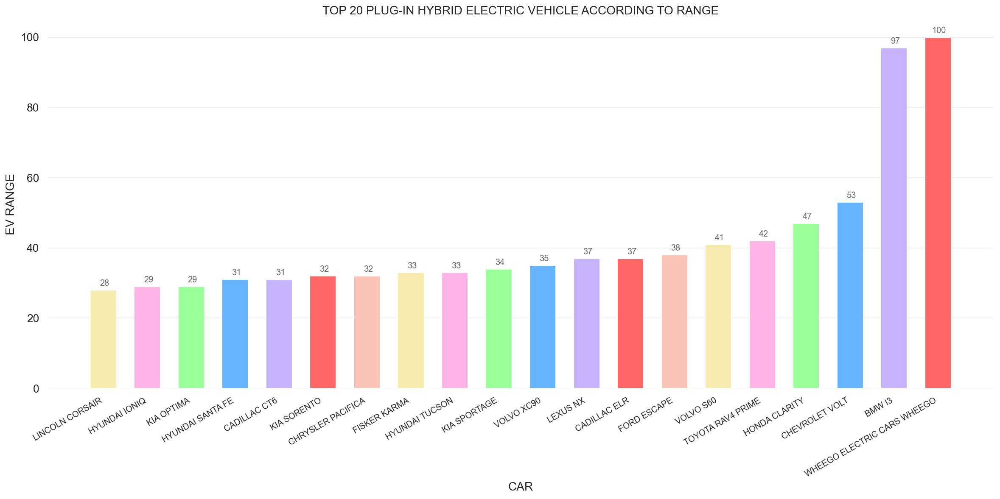

In [33]:
top20_phev = phev_df.drop_duplicates(subset='Car_Name').nlargest(20, 'Electric Range')
top20_phev.sort_values('Electric Range',ascending=True,inplace=True)
plt.rcParams['figure.figsize'] = (20, 8)

def autolabel(rectangle_group):
    for rect in rectangle_group:
        height=rect.get_height()
        ax.annotate(str(height),
                    xy=(rect.get_x()+rect.get_width()/2,height),
                    ha='center',
                    xytext=(1.5,5),
                    textcoords='offset points',
                    color='dimgrey',
                    fontsize=10)

width = 0.6
fig,ax = plt.subplots()
rect1 = ax.bar(top20_phev['Car_Name'], top20_phev['Electric Range'], width, 
               color=colors, tick_label=top20_phev['Car_Name'])
autolabel(rect1)
ax.set_title('TOP 20 PLUG-IN HYBRID ELECTRIC VEHICLE ACCORDING TO RANGE',fontsize=14)
ax.set_xlabel('CAR',fontsize=14)
ax.set_ylabel('EV RANGE',fontsize=14)
ax.yaxis.grid(True, color='#EEEEEE')
ax.set_facecolor('white')
ax.xaxis.grid(False)
# Adjust the horizontal alignment of tick labels to the right
ax.set_xticklabels(top20_phev['Car_Name'],ha='right',fontsize=10)
plt.xticks(rotation=30)
plt.show()
plt.show()


# Conclusion: Wheego Electric Car provides the best range among all the PHEV but its still less than average BEV.

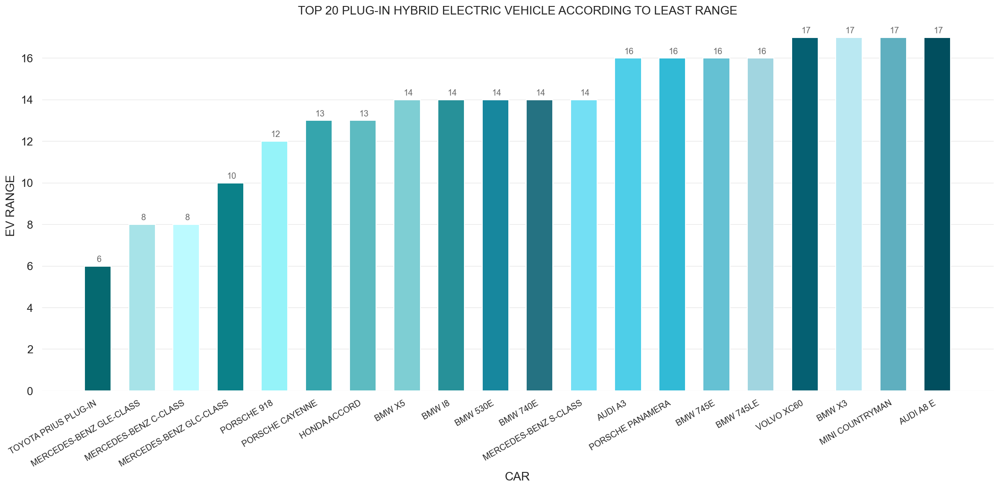

In [34]:
least20_phev=phev_df[phev_df['Electric Range']!=0]
least20_phev = least20_phev.drop_duplicates(subset='Car_Name').nsmallest(20, 'Electric Range')
plt.rcParams['figure.figsize'] = (20, 8)

def autolabel(rectangle_group):
    for rect in rectangle_group:
        height=rect.get_height()
        ax.annotate(str(height),
                    xy=(rect.get_x()+rect.get_width()/2,height),
                    ha='center',
                    xytext=(1.5,5),
                    textcoords='offset points',
                    color='dimgrey',
                    fontsize=10)

width = 0.6
fig,ax = plt.subplots()
rect1 = ax.bar(least20_phev['Car_Name'], least20_phev['Electric Range'], width, 
               color=colour9, tick_label=least20_phev['Car_Name'])
autolabel(rect1)
ax.set_title('TOP 20 PLUG-IN HYBRID ELECTRIC VEHICLE ACCORDING TO LEAST RANGE',fontsize=14)
ax.set_xlabel('CAR',fontsize=14)
ax.set_ylabel('EV RANGE',fontsize=14)
ax.yaxis.grid(True, color='#EEEEEE')
ax.set_facecolor('white')
ax.xaxis.grid(False)
# Adjust the horizontal alignment of tick labels to the right
ax.set_xticklabels(least20_phev['Car_Name'],ha='right',fontsize=10)
plt.xticks(rotation=30)
plt.show()
plt.show()


# Conclusion: Toyoto Prius Plug-In provides the least range among all PHEV.

In [35]:
electric_utility = usa_ev['Electric Utility'].value_counts().reset_index().rename(columns={'index': 'Electric Utility',
                                                                            'Electric Utility':'Total Customer'})
electric_utility

,Electric Utility,Total Customer
0,PUGET SOUND ENERGY INC||CITY OF TACOMA - (WA),44931
1,PUGET SOUND ENERGY INC,24637
2,CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),23258
3,BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF C...,7223
4,BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,5602
...,...,...
68,BONNEVILLE POWER ADMINISTRATION||CITY OF COULE...,2
69,BONNEVILLE POWER ADMINISTRATION||PENINSULA LIG...,1
70,BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF A...,1
71,CITY OF SEATTLE - (WA),1


In [36]:
#There are total 73 Electric Utilities in USA
electric_utility['Electric Utility'].nunique()

73

In [37]:
top20_electric_utility=electric_utility.nlargest(20, 'Total Customer')
top20_electric_utility.sort_values('Total Customer',ascending=True,inplace=True)
top20_electric_utility

,Electric Utility,Total Customer
19,BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF F...,379
18,BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF G...,440
17,BONNEVILLE POWER ADMINISTRATION||CITY OF TACOM...,514
16,BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF C...,613
15,BONNEVILLE POWER ADMINISTRATION||PUD NO 1 OF C...,618
14,BONNEVILLE POWER ADMINISTRATION||CITY OF RICHL...,659
13,PUD NO 1 OF CHELAN COUNTY,731
12,BONNEVILLE POWER ADMINISTRATION||PUGET SOUND E...,747
11,BONNEVILLE POWER ADMINISTRATION||ORCAS POWER &...,761
10,MODERN ELECTRIC WATER COMPANY,783


Text(0, 0.5, 'Electric Utility')

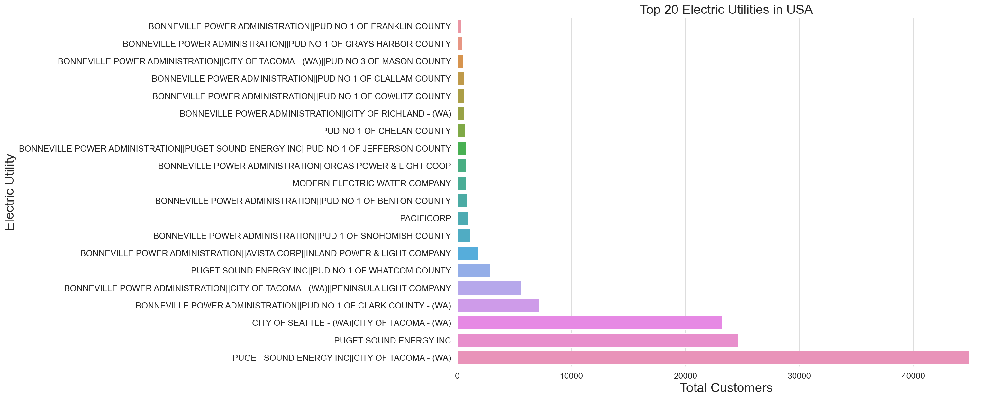

In [38]:
sns.set_style('darkgrid')
ax=sns.barplot(data=top20_electric_utility, y="Electric Utility", x="Total Customer",orient='h')
ax.set_facecolor('white')
ax.xaxis.grid(True, color='#DDDDDD')
ax.set_facecolor('white')
fig = ax.get_figure()
fig.set_size_inches(15, 10)
ax.axes.set_title("Top 20 Electric Utilities in USA", fontsize=20)
ax.set_xlabel('Total Customers', fontsize=20)
ax.set_ylabel('Electric Utility', fontsize=20)

In [39]:
top5_electric_utility=electric_utility.nlargest(5, 'Total Customer')

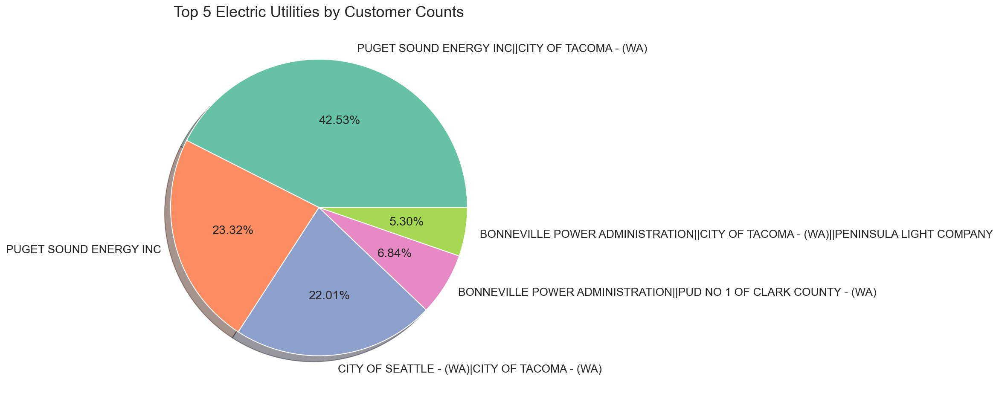

In [40]:
labels = top5_electric_utility['Electric Utility']
sizes = top5_electric_utility['Total Customer']
sns.set(font_scale = 1.2)
plt.figure(figsize=(8,8))
plt.pie(
    x=sizes, 
    labels=labels,
    autopct='%1.2f%%',
    colors=sns.color_palette('Set2'),
    shadow=True
)
plt.title('Top 5 Electric Utilities by Customer Counts', y=1, fontsize=18)
plt.show()


In [41]:
usa_ev['Model Year'].nunique()

21

In [42]:
usa_ev['Model Year'].sort_values().unique()

array([1997, 1998, 1999, 2000, 2002, 2003, 2008, 2010, 2011, 2012, 2013,
       2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023],
      dtype=int64)

In [43]:
usa_ev['City'].nunique()

447

In [44]:
usa_ev['County'].nunique()

39

In [45]:
usa_ev['County'].unique()

array(['Yakima', 'Snohomish', 'Kitsap', 'Thurston', 'Grant', 'Skagit',
       'King', 'Chelan', 'Whitman', 'Stevens', 'Spokane', 'Walla Walla',
       'Adams', 'Island', 'Pierce', 'Clark', 'Pacific', 'Whatcom',
       'Cowlitz', 'Kittitas', 'San Juan', 'Jefferson', 'Lewis', 'Clallam',
       'Grays Harbor', 'Benton', 'Klickitat', 'Douglas', 'Mason',
       'Franklin', 'Skamania', 'Okanogan', 'Columbia', 'Pend Oreille',
       'Asotin', 'Lincoln', 'Wahkiakum', 'Ferry', 'Garfield'],
      dtype=object)

In [46]:
county_df=pd.DataFrame(usa_ev['County'].value_counts())
county_df.head()

,County
King,65148
Snohomish,14017
Pierce,9525
Clark,7392
Thurston,4528


In [47]:
county_df.reset_index(inplace=True)
county_df.head()

,index,County
0,King,65148
1,Snohomish,14017
2,Pierce,9525
3,Clark,7392
4,Thurston,4528


In [48]:
county_df.rename(columns={'index':'County','County':'Total EV Sales'},inplace=True)

In [49]:
county_df.head()

,County,Total EV Sales
0,King,65148
1,Snohomish,14017
2,Pierce,9525
3,Clark,7392
4,Thurston,4528


In [50]:
top20_county_sale=county_df.nlargest(20,'Total EV Sales')
top20_county_sale.sort_values('Total EV Sales',ascending=True,inplace=True)

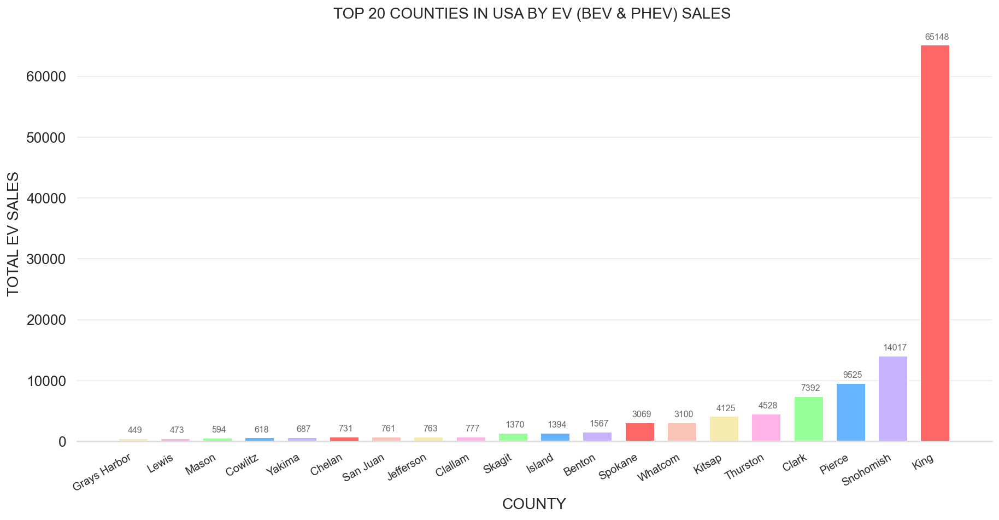

In [51]:
plt.rcParams['figure.figsize'] = (15, 7)
fig, ax = plt.subplots()
def autolabel(rectangle_group):
    for rect in rectangle_group:
        height=rect.get_height()
        ax.annotate(str(height),
                    xy=(rect.get_x()+rect.get_width()/2,height),
                    ha='center',
                    xytext=(1.5,5),
                    textcoords='offset points',
                    color='dimgrey',
                    fontsize=8)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#DDDDDD')
ax.tick_params(bottom=False, left=False)
ax.set_axisbelow(True)
ax.yaxis.grid(True, color='#EEEEEE')
ax.set_facecolor('white')
ax.xaxis.grid(False)
rect=ax.bar(
    x=top20_county_sale.County,width=0.7,color=colors,
    height=top20_county_sale['Total EV Sales'],
    tick_label=top20_county_sale.County
)
autolabel(rect)
plt.xticks(rotation=30,ha='right',fontsize=10)
plt.xlabel("COUNTY",fontsize=14)
plt.ylabel("TOTAL EV SALES",fontsize=14)
plt.title("TOP 20 COUNTIES IN USA BY EV (BEV & PHEV) SALES ",fontsize=14)
plt.show()

# Conclusion: King County is by far the largest market for the EVs.

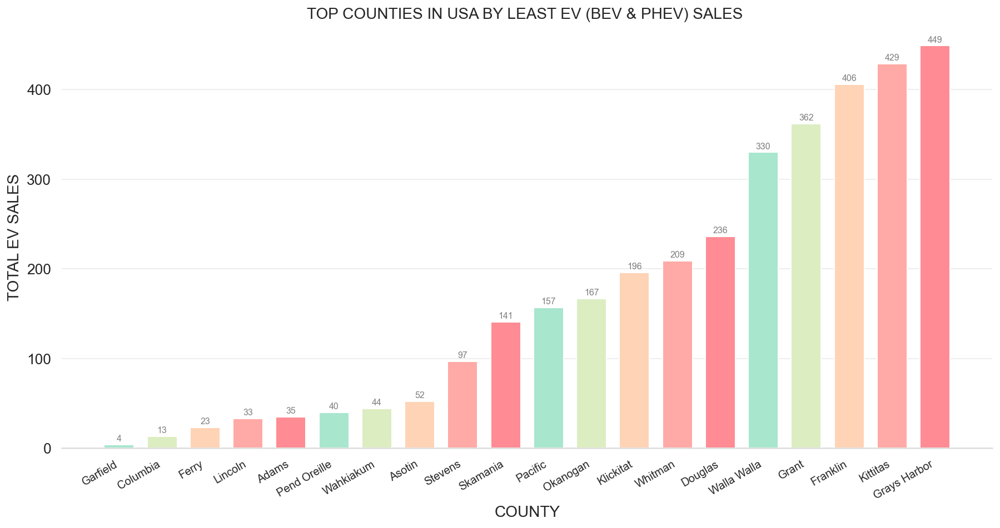

In [52]:
worst20_county_sale=county_df.nsmallest(20,'Total EV Sales')
plt.rcParams['figure.figsize'] = (15, 7)
fig, ax = plt.subplots()
def autolabel(rectangle_group): # function for display bar heights which is annotation
    for rect in rectangle_group:
        height=rect.get_height()
        ax.annotate(str(height), # to get the height of bar or basically values of y-axis.
                    xy=(rect.get_x()+rect.get_width()/2,height), # to get the x and y coordinates to print text.
                    ha='center', # to align the text at center of the bar
                    xytext=(0,3), # to put a space between bar and text, 0 is x axis and y is the distance btw bar and text.
                    textcoords='offset points', # text will not be shown without it.
                    color='grey',
                   fontsize=8)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#DDDDDD')
ax.tick_params(bottom=False, left=False)
ax.set_axisbelow(True)
ax.yaxis.grid(True, color='#EEEEEE')
ax.set_facecolor('white')
ax.xaxis.grid(False)
rect=ax.bar(
    x=worst20_county_sale.County,width=0.7,color=colour1,
    height=worst20_county_sale['Total EV Sales'],
    tick_label=worst20_county_sale.County
)
autolabel(rect)
plt.xticks(rotation=30,ha='right',fontsize=10)
plt.xlabel("COUNTY",fontsize=14)
plt.ylabel("TOTAL EV SALES",fontsize=14)
plt.title("TOP COUNTIES IN USA BY LEAST EV (BEV & PHEV) SALES ",fontsize=14)
plt.show()

# Conclusion: Garfield is the worst county for electric vehicles.

In [53]:
yearwise_model = usa_ev.groupby(['Model Year', 'Car_Name'])['Car_Name'].count().reset_index(name='Total Sale')
yearwise_model


,Model Year,Car_Name,Total Sale
0,1997,CHEVROLET S-10 PICKUP,1
1,1998,FORD RANGER,1
2,1999,FORD RANGER,4
3,2000,FORD RANGER,9
4,2002,TOYOTA RAV4,2
...,...,...,...
394,2023,TOYOTA RAV4 PRIME,93
395,2023,VOLKSWAGEN ID.4,630
396,2023,VOLVO C40,107
397,2023,VOLVO S90,1


In [54]:
yearwise_topmodel = yearwise_model.reset_index() 
top_model_each_year = yearwise_topmodel.set_index(['Model Year','Car_Name']).groupby(level=0)['Total Sale'].idxmax().reset_index(name='Car_Name')
top_model_each_year

,Model Year,Car_Name
0,1997,"(1997, CHEVROLET S-10 PICKUP)"
1,1998,"(1998, FORD RANGER)"
2,1999,"(1999, FORD RANGER)"
3,2000,"(2000, FORD RANGER)"
4,2002,"(2002, TOYOTA RAV4)"
5,2003,"(2003, TOYOTA RAV4)"
6,2008,"(2008, TESLA ROADSTER)"
7,2010,"(2010, TESLA ROADSTER)"
8,2011,"(2011, NISSAN LEAF)"
9,2012,"(2012, NISSAN LEAF)"


In [55]:
top_model_each_year['Car_Name'] = top_model_each_year['Car_Name'].astype(str)
print(top_model_each_year)
top_model_each_year['Car_Name'] = top_model_each_year['Car_Name'].str.replace(r'\(\d+\,\s','')
top_model_each_year['Car_Name'] = top_model_each_year['Car_Name'].str.replace(r'\)','' )
top_model_each_year['Car_Name'] = top_model_each_year['Car_Name'].str.replace("'", "")
top_model_each_year

    Model Year                         Car_Name
0         1997  (1997, 'CHEVROLET S-10 PICKUP')
1         1998            (1998, 'FORD RANGER')
2         1999            (1999, 'FORD RANGER')
3         2000            (2000, 'FORD RANGER')
4         2002            (2002, 'TOYOTA RAV4')
5         2003            (2003, 'TOYOTA RAV4')
6         2008         (2008, 'TESLA ROADSTER')
7         2010         (2010, 'TESLA ROADSTER')
8         2011            (2011, 'NISSAN LEAF')
9         2012            (2012, 'NISSAN LEAF')
10        2013            (2013, 'NISSAN LEAF')
11        2014            (2014, 'NISSAN LEAF')
12        2015            (2015, 'NISSAN LEAF')
13        2016            (2016, 'NISSAN LEAF')
14        2017         (2017, 'CHEVROLET VOLT')
15        2018          (2018, 'TESLA MODEL 3')
16        2019          (2019, 'TESLA MODEL 3')
17        2020          (2020, 'TESLA MODEL 3')
18        2021          (2021, 'TESLA MODEL Y')
19        2022          (2022, 'TESLA MO

,Model Year,Car_Name
0,1997,CHEVROLET S-10 PICKUP
1,1998,FORD RANGER
2,1999,FORD RANGER
3,2000,FORD RANGER
4,2002,TOYOTA RAV4
5,2003,TOYOTA RAV4
6,2008,TESLA ROADSTER
7,2010,TESLA ROADSTER
8,2011,NISSAN LEAF
9,2012,NISSAN LEAF


Text(0.5, 1.0, 'Top Model Each Year Between 1997-2023')

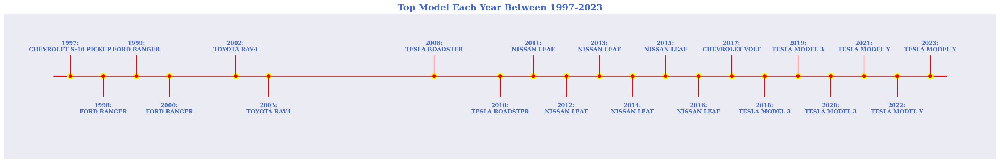

In [56]:
labels = top_model_each_year['Car_Name']
# labels with associated year
labels = ['{0}:\n{1}'.format(d, l) for l, d in zip(labels, top_model_each_year['Model Year'])]
min_date = top_model_each_year['Model Year'][0] - 2
max_date = top_model_each_year['Model Year'].iloc[-1] + 2
fig, ax = plt.subplots(figsize=(25, 4), constrained_layout=True)
ax.set_ylim(-2, 1.5)
ax.set_xlim(min_date, max_date)
ax.axhline(0, xmin=0.05, xmax=0.95, c='red', zorder=1)
ax.scatter(top_model_each_year['Model Year'], np.zeros(len(top_model_each_year['Model Year'])), s=120, c='yellow', zorder=2)
ax.scatter(top_model_each_year['Model Year'], np.zeros(len(top_model_each_year['Model Year'])), s=30, c='red', zorder=3)
label_offsets = np.zeros(len(top_model_each_year['Model Year']))
label_offsets[::2] = 0.6
label_offsets[1::2] = -0.9
for i, (l, d) in enumerate(zip(labels, top_model_each_year['Model Year'])):
    ax.text(d, label_offsets[i], l, ha='center', fontfamily='serif', fontweight='bold', color='royalblue', fontsize=10)
stems = np.zeros(len(top_model_each_year['Model Year']))
stems[::2] = 0.5  # Increase this value to increase the distance between points
stems[1::2] = -0.5  # Increase this value to increase the distance between points
markerline, stemline, baseline = ax.stem(top_model_each_year['Model Year'], stems, use_line_collection=True)
plt.setp(markerline, marker=',', color='red')
plt.setp(stemline, color='red')
# hide lines around chart
for spine in ["left", "top", "right", "bottom"]:
    ax.spines[spine].set_visible(False)
 
# hide tick labels
ax.set_xticks([])
ax.set_yticks([]) 
ax.set_title('Top Model Each Year Between 1997-2023', fontweight="bold", fontfamily='serif', fontsize=16, color='royalblue')


# Conclusion: Tesla's EV are the most popular electric cars for the past 6 years.

In [57]:
topManufacturers=usa_ev.groupby('Make').size().reset_index(name='Total Sales')
topManufacturers.sort_values('Total Sales',ascending=False,inplace=True)

In [58]:
topManufacturers

,Make,Total Sales
29,TESLA,56907
23,NISSAN,12919
5,CHEVROLET,10800
9,FORD,6646
3,BMW,5556
15,KIA,4831
31,TOYOTA,4632
32,VOLKSWAGEN,3356
0,AUDI,2472
33,VOLVO,2324


In [59]:
plt.figure(figsize=(25,15))
fig = px.bar(topManufacturers, x="Make", y="Total Sales",color='Total Sales')
fig.update_layout(
    title={
        'text': 'Top Manufacturers of EV in USA',
        'font': {'size': 16}  
    },
    xaxis_title='Manufacturer',
    yaxis_title='Total Sales',  
    xaxis_title_font={'size': 15}, 
    yaxis_title_font={'size': 15},
    title_x=0.5,title_y=0.95,
)
for i,(make,sales) in enumerate(zip(topManufacturers['Make'],topManufacturers['Total Sales'])):
    fig.add_annotation(x=make,y=sales,text=sales,showarrow=True,
                       arrowhead=1,arrowsize=1,font=dict(size=10),
                      xanchor='left',yanchor='top')
fig.show()

<Figure size 1800x1080 with 0 Axes>

# Conclusion: Tesla is the most popular EV brand. 

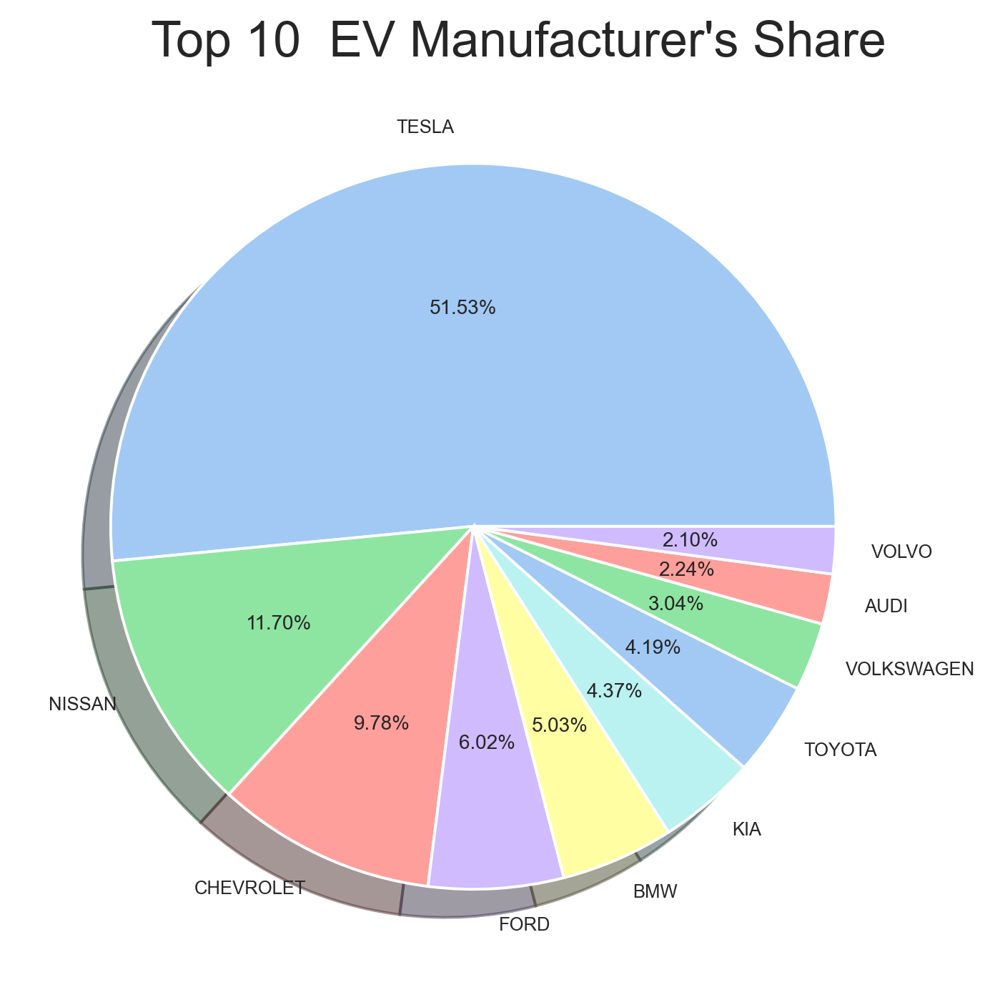

In [60]:
labels = topManufacturers['Make'][:10]
sizes = topManufacturers['Total Sales'][:10]
sns.set(font_scale = 0.6)
plt.figure(figsize=(6,6),dpi=140)
plt.pie(
    x=sizes, 
    labels=labels,
    autopct='%1.2f%%',
    colors=sns.color_palette('pastel6'),
    shadow=True
)
plt.title("Top 10  EV Manufacturer's Share",x=0.55, y=1, fontsize=18)
plt.show()

# Conclusion: Tesla holds the more than half of the EV market among the top 10 EV manufacturers.

In [61]:
topManufacturers
top10_manufacturers=topManufacturers['Make'][:10]
top10_manufacturers

29         TESLA
23        NISSAN
5      CHEVROLET
9           FORD
3            BMW
15           KIA
31        TOYOTA
32    VOLKSWAGEN
0           AUDI
33         VOLVO
Name: Make, dtype: object

In [62]:
# Group the data by 'Make' and 'Model' columns and sum the units sold
grouped = usa_ev.groupby(['Make', 'Model','Car_Name']).size().reset_index(name='Total Units')

# Sort the data by 'Make' and 'Units Sold' in descending order
sorted_data = grouped.sort_values(['Make', 'Total Units'], ascending=[True, False])
print(sorted_data)
# Get the top selling model for each car company along with the total units sold
top_selling_models = sorted_data.groupby('Make').first().reset_index()

# Print the result
top_selling_models


                     Make             Model                     Car_Name  \
3                    AUDI            E-TRON                  AUDI E-TRON   
0                    AUDI                A3                      AUDI A3   
8                    AUDI              Q5 E                    AUDI Q5 E   
5                    AUDI  E-TRON SPORTBACK        AUDI E-TRON SPORTBACK   
7                    AUDI                Q5                      AUDI Q5   
..                    ...               ...                          ...   
112                 VOLVO               C40                    VOLVO C40   
113                 VOLVO               S60                    VOLVO S60   
114                 VOLVO               S90                    VOLVO S90   
115                 VOLVO               V60                    VOLVO V60   
119  WHEEGO ELECTRIC CARS            WHEEGO  WHEEGO ELECTRIC CARS WHEEGO   

     Total Units  
3            866  
0            568  
8            473  
5          

,Make,Model,Car_Name,Total Units
0,AUDI,E-TRON,AUDI E-TRON,866
1,AZURE DYNAMICS,TRANSIT CONNECT ELECTRIC,AZURE DYNAMICS TRANSIT CONNECT ELECTRIC,7
2,BENTLEY,BENTAYGA,BENTLEY BENTAYGA,2
3,BMW,I3,BMW I3,1881
4,CADILLAC,ELR,CADILLAC ELR,73
5,CHEVROLET,BOLT EV,CHEVROLET BOLT EV,4976
6,CHRYSLER,PACIFICA,CHRYSLER PACIFICA,1893
7,FIAT,500,FIAT 500,808
8,FISKER,KARMA,FISKER KARMA,14
9,FORD,MUSTANG MACH-E,FORD MUSTANG MACH-E,2125


In [63]:
top_selling_models.sort_values(by='Total Units',ascending=False,inplace=True)

In [64]:
top20_selling_models=top_selling_models[:20]
plt.figure(figsize=(30,18))
fig = px.bar(top20_selling_models, x='Car_Name', y='Total Units',color='Total Units')

# Add annotations to the bar plot

for i, row in top20_selling_models.iterrows():
    fig.add_annotation(
        x=row['Car_Name'],
        y=row['Total Units'],
        text=str(row['Total Units']),
        showarrow=True,
        arrowhead=1,arrowsize=2,font=dict(size=10),
        xanchor='center',yanchor='middle'
    )

# Customize the layout of the figure
fig.update_layout(
    title='Top 20 Selling Models by Car Company',
    xaxis_title='Model Name',
    yaxis_title='Total Units Sold',
    title_x=0.5,title_y=0.95
)
fig.show()

<Figure size 2160x1296 with 0 Axes>

# Conclusion: Tesla holds the biggest market share.

In [65]:
top_models=usa_ev.groupby('Car_Name').size().sort_values(ascending=False).reset_index(name='Total Sales')
plt.figure(figsize=(25,15))
fig = px.bar(top_models[:10], x="Car_Name", y="Total Sales",color='Total Sales',opacity=1)
fig.update_layout(
    title={
        'text': 'Top 10 EVs in use in USA',
        'font': {'size': 16}  
    },
    xaxis_title='Model',
    yaxis_title='Total Sales',  
    xaxis_title_font={'size': 15}, 
    yaxis_title_font={'size': 15},
    title_x=0.5,title_y=0.95
)
fig.show()

<Figure size 1800x1080 with 0 Axes>

# Conclusion: Tesla Model 3 is the most selling electric car and 4 out of top 10 selling models are of Tesla.

#                               :- Study of most popular company TESLA :-

In [66]:
data_TESLA = usa_ev[usa_ev['Make']=='TESLA']
top10_county_TESLA = list(data_TESLA.groupby('County').count().sort_values(by='City',ascending=False)['City'].index)[:10]
values = list(data_TESLA.groupby('County').count().sort_values(by='City',ascending=False)['City'].values)[:10]

In [67]:
plt.figure(figsize=(25,15))
fig = px.bar(x=top10_county_TESLA, y=values,color=values)
fig.update_layout(
    title={
        'text': 'Top 10 County for TESLA in USA',
        'font': {'size': 16}  
    },
    xaxis_title='County',
    yaxis_title='Total Sales',  
    xaxis_title_font={'size': 15}, 
    yaxis_title_font={'size': 15},
    title_x=0.5,title_y=0.95
)

for i, v in enumerate(values):
    fig.add_annotation(x=top10_county_TESLA[i], y=v, text=str(v), showarrow=True,arrowhead=1,arrowsize=2,
                       font=dict(size=12), xanchor='center', yanchor='bottom')

fig.show()

<Figure size 1800x1080 with 0 Axes>

# King is the most popular county for Tesla cars.

In [68]:
top_10_year_TESLA = list(data_TESLA.groupby('Model Year').count().sort_values(by='City',ascending=False)['City'].index)[:10]
values = list(data_TESLA.groupby('Model Year').count().sort_values(by='City',ascending=False)['City'].values)[:10]

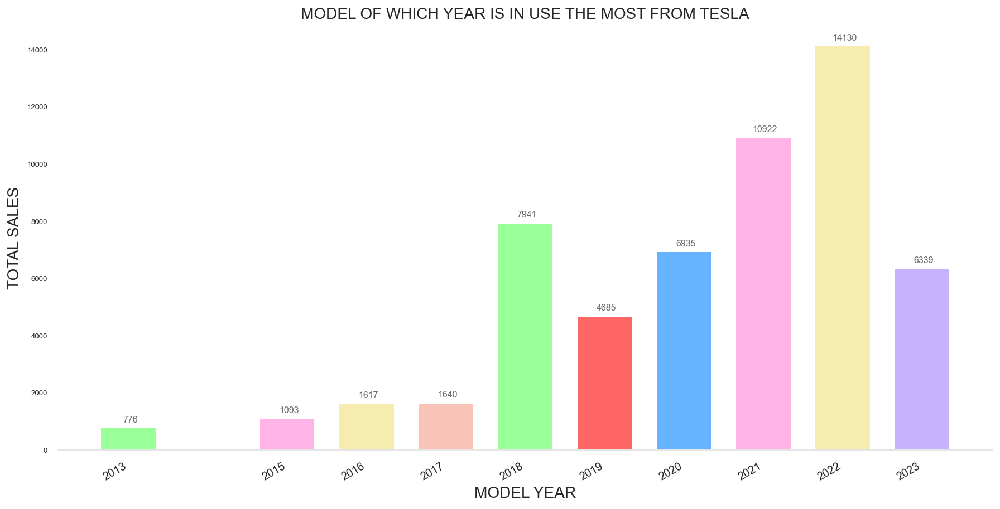

In [69]:
plt.rcParams['figure.figsize'] = (15, 7)
fig, ax = plt.subplots()
def autolabel(rectangle_group):
    for rect in rectangle_group:
        height=rect.get_height()
        ax.annotate(str(height),
                    xy=(rect.get_x()+rect.get_width()/2,height),
                    ha='center',
                    xytext=(1.5,5),
                    textcoords='offset points',
                    color='dimgrey',
                    fontsize=8)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_color('#DDDDDD')
ax.tick_params(bottom=False, left=False)
ax.set_axisbelow(True)
ax.yaxis.grid(False)
ax.set_facecolor('white')
ax.xaxis.grid(False)
rect=ax.bar(
    x=top_10_year_TESLA,width=0.7,color=colors,
    height=values,
    tick_label=top_10_year_TESLA
)
autolabel(rect)
plt.xticks(rotation=30,ha='right',fontsize=10)
plt.xlabel("MODEL YEAR",fontsize=14)
plt.ylabel("TOTAL SALES",fontsize=14)
plt.title("MODEL OF WHICH YEAR IS IN USE THE MOST FROM TESLA",fontsize=14)
plt.show()

# Conclusion: Tesla 2022 model is most successful model for Tesla followed by 2021 and 2018.

In [70]:
stations=pd.read_csv('ev_stations.csv')

In [71]:
stations.head()

,Fuel Type Code,Station Name,Street Address,City,State,ZIP,Station Phone,Status Code,Groups With Access Code,Access Days Time,...,ID,Updated At,Open Date,EV Connector Types,Country,Groups With Access Code (French),Access Code,text,"Name,Address",Name_Address
0,ELEC,Northridge Fashion Center - Yard House,9301 Tampa Ave,Northridge,CA,91324,818-885-9700,E,Public,6am-12am daily,...,7192,2021-04-08 20:32:57 UTC,1998-05-30,J1772,US,Public,public,"Northridge Fashion Center - Yard House, Northr...","Northridge Fashion Center - Yard House, Northr...","Northridge Fashion Center - Yard House, Northr..."
1,ELEC,Westfield Fashion Square,14006 Riverside Dr,Sherman Oaks,CA,91423,818-783-0550,E,Public,6am-12am daily,...,7233,2021-04-08 20:32:57 UTC,1998-05-30,J1772,US,Public,public,"Westfield Fashion Square, Sherman Oaks, CA, US","Westfield Fashion Square, Sherman Oaks, CA, US","Westfield Fashion Square, Sherman Oaks, CA, US"
2,ELEC,Van Nuys Amtrak/Metrolink Station,7724 Van Nuys Blvd,Van Nuys,CA,91405,800-371-5465,E,Public,24 hours daily,...,7245,2021-03-11 23:22:17 UTC,1998-06-30,J1772,US,Public,public,"Van Nuys Amtrak/Metrolink Station, Van Nuys, C...","Van Nuys Amtrak/Metrolink Station, Van Nuys, C...","Van Nuys Amtrak/Metrolink Station, Van Nuys, C..."
3,ELEC,Northridge Metrolink Station,8775 Wilbur Ave,Northridge,CA,91324,866-816-7584 800-371-5465,E,Public,24 hours daily,...,21398,2021-03-11 23:22:17 UTC,2019-04-01,J1772,US,Public,public,"Northridge Metrolink Station, Northridge, CA, US","Northridge Metrolink Station, Northridge, CA, US","Northridge Metrolink Station, Northridge, CA, US"
4,ELEC,Sylmar Metrolink Station,Village Way Dr,San Fernando,CA,91342,866-816-7584 818-237-7641,E,Public,24 hours daily,...,21414,2021-03-11 23:22:17 UTC,2019-04-01,J1772,US,Public,public,"Sylmar Metrolink Station, San Fernando, CA, US","Sylmar Metrolink Station, San Fernando, CA, US","Sylmar Metrolink Station, San Fernando, CA, US"


In [72]:
stations.isnull().sum()

Fuel Type Code                      0
Station Name                        0
Street Address                      0
City                                0
State                               0
ZIP                                 0
Station Phone                       0
Status Code                         0
Groups With Access Code             0
Access Days Time                    0
EV Network                          0
EV Network Web                      0
Geocode Status                      0
Latitude                            0
Longitude                           0
Date Last Confirmed                 0
ID                                  0
Updated At                          0
Open Date                           0
EV Connector Types                  0
Country                             0
Groups With Access Code (French)    0
Access Code                         0
text                                0
Name,Address                        0
Name_Address                        0
dtype: int64

In [73]:
stations.shape

(41235, 26)

In [74]:
stations.describe()

,Latitude,Longitude,ID
count,41235.000000,41235.000000,41235.000000
mean,37.561468,-99.139932,160369.466497
std,4.893147,19.614232,34444.424687
min,18.334138,-159.585878,7192.000000
25%,33.982552,-118.385886,148676.000000
50%,37.789878,-96.847188,171390.000000
75%,40.870444,-80.243222,183320.500000
max,64.852466,0.000000,204787.000000


In [75]:
fig = go.Figure(data=go.Scattergeo(
        lon = stations['Longitude'],
        lat = stations['Latitude'],
        text = stations['Name_Address'],
        mode = 'markers'
        ))

fig.update_layout(
        title = 'EV Stations in USA',
        geo_scope='usa',
    )
fig.show()

# Conclusion: Eastern USA has most number of charging stations and center USA has least number of charging stations.

In [76]:
wa_stations=stations[stations['State']=='WA'].copy()
wa_stations

,Fuel Type Code,Station Name,Street Address,City,State,ZIP,Station Phone,Status Code,Groups With Access Code,Access Days Time,...,ID,Updated At,Open Date,EV Connector Types,Country,Groups With Access Code (French),Access Code,text,"Name,Address",Name_Address
30,ELEC,BELLEVUE BELLEVUE CH 1,450 110th Ave NE,Bellevue,WA,98004,888-758-4389,E,Public,24 hours daily,...,37181,2022-01-14 00:29:34 UTC,2010-12-15,J1772,US,Public,public,"BELLEVUE BELLEVUE CH 1, Bellevue, WA, US","BELLEVUE BELLEVUE CH 1, Bellevue, WA, US","BELLEVUE BELLEVUE CH 1, Bellevue, WA, US"
33,ELEC,KING COUNTY DOT ISSAQUAH P&R 2,1755 Highlands Dr NE,Issaquah,WA,98027,888-758-4389,E,Public,24 hours daily,...,38082,2022-01-14 00:29:34 UTC,2008-02-15,J1772,US,Public,public,"KING COUNTY DOT ISSAQUAH P&R 2, Issaquah, WA, US","KING COUNTY DOT ISSAQUAH P&R 2, Issaquah, WA, US","KING COUNTY DOT ISSAQUAH P&R 2, Issaquah, WA, US"
38,ELEC,UWB CASCADIA CC NORTH DUAL 1,18500 Campus Way NE,Bothell,WA,98011,888-758-4389,E,Public,24 hours daily,...,38952,2022-01-14 00:29:34 UTC,2011-03-15,J1772,US,Public,public,"UWB CASCADIA CC NORTH DUAL 1, Bothell, WA, US","UWB CASCADIA CC NORTH DUAL 1, Bothell, WA, US","UWB CASCADIA CC NORTH DUAL 1, Bothell, WA, US"
39,ELEC,CITY OF REDMOND CITY HALL DUAL,15670 NE 85th St,Redmond,WA,98052,888-758-4389,E,Public,24 hours daily,...,38959,2022-01-14 00:29:34 UTC,2011-03-15,J1772,US,Public,public,"CITY OF REDMOND CITY HALL DUAL, Redmond, WA, US","CITY OF REDMOND CITY HALL DUAL, Redmond, WA, US","CITY OF REDMOND CITY HALL DUAL, Redmond, WA, US"
40,ELEC,CITY OF REDMOND MOC #1 PUBLIC,18080 NE 76th St,Redmond,WA,98052,888-758-4389,E,Public,24 hours daily,...,38966,2022-01-14 00:29:34 UTC,2011-03-15,J1772,US,Public,public,"CITY OF REDMOND MOC #1 PUBLIC, Redmond, WA, US","CITY OF REDMOND MOC #1 PUBLIC, Redmond, WA, US","CITY OF REDMOND MOC #1 PUBLIC, Redmond, WA, US"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40912,ELEC,CPU DC STATION 2,850 Officers Row,Vancouver,WA,98661,888-758-4389,E,Public,24 hours daily,...,204259,2022-01-14 00:29:34 UTC,2022-01-04,CHADEMO J1772COMBO,US,Public,public,"CPU DC STATION 2, Vancouver, WA, US","CPU DC STATION 2, Vancouver, WA, US","CPU DC STATION 2, Vancouver, WA, US"
41034,ELEC,FAST FUEL 2 STATION 1,501 Lilly Rd SE,Olympia,WA,98501,888-758-4389,E,Public,24 hours daily,...,204497,2022-01-14 00:29:34 UTC,2022-01-08,CHADEMO J1772COMBO,US,Public,public,"FAST FUEL 2 STATION 1, Olympia, WA, US","FAST FUEL 2 STATION 1, Olympia, WA, US","FAST FUEL 2 STATION 1, Olympia, WA, US"
41069,ELEC,HOMEWOOD SUITES HOMEWOOD #1,1484 Hyla Ave NW,Issaquah,WA,98027,888-758-4389,E,Public,24 hours daily,...,204538,2022-01-14 00:29:34 UTC,2022-01-10,J1772,US,Public,public,"HOMEWOOD SUITES HOMEWOOD #1, Issaquah, WA, US","HOMEWOOD SUITES HOMEWOOD #1, Issaquah, WA, US","HOMEWOOD SUITES HOMEWOOD #1, Issaquah, WA, US"
41131,ELEC,FAST FUEL 2 STATION 2,501 Lilly Rd SE,Olympia,WA,98501,888-758-4389,E,Public,24 hours daily,...,204664,2022-01-14 00:29:34 UTC,2022-01-12,CHADEMO J1772COMBO,US,Public,public,"FAST FUEL 2 STATION 2, Olympia, WA, US","FAST FUEL 2 STATION 2, Olympia, WA, US","FAST FUEL 2 STATION 2, Olympia, WA, US"


In [77]:
fig = go.Figure(data=go.Scattergeo(
        lon = wa_stations['Longitude'],
        lat = wa_stations['Latitude'],
        text = wa_stations['Name_Address'],
        mode = 'markers'
        ))

fig.update_layout(
        title = 'EV Stations in Washington State',
        geo_scope='usa',
    )
fig.show()

In [78]:
city_station=wa_stations['City'].value_counts().reset_index()
city_station=city_station.rename(columns={'index':'City','City':'Total Stations'})
city_station

,City,Total Stations
0,Seattle,368
1,Bellevue,179
2,Tacoma,63
3,Spokane,45
4,Vancouver,43
...,...,...
153,Snoqualmie Pass,1
154,Camano,1
155,East Wenatchee,1
156,Vashon,1


In [79]:
ev_sold_city=usa_ev['City'].value_counts().reset_index()
ev_sold_city=ev_sold_city.rename(columns={'index':'City','City':'EVs Sold'})
ev_sold_city

,City,EVs Sold
0,Seattle,21946
1,Bellevue,6476
2,Redmond,4641
3,Vancouver,4462
4,Kirkland,3920
...,...,...
442,Rockport,1
443,Carrolls,1
444,Smith Creek,1
445,Hunters,1


In [80]:
merge_city=pd.merge(city_station,ev_sold_city)

In [81]:
merge_city

,City,Total Stations,EVs Sold
0,Seattle,368,21946
1,Bellevue,179,6476
2,Tacoma,63,2653
3,Spokane,45,1845
4,Vancouver,43,4462
...,...,...,...
135,Steilacoom,1,135
136,Snoqualmie Pass,1,19
137,East Wenatchee,1,180
138,Vashon,1,485


In [82]:
merge_city.sort_values(by='EVs Sold',ascending=False,inplace=True)

In [83]:
merge_city

,City,Total Stations,EVs Sold
0,Seattle,368,21946
1,Bellevue,179,6476
10,Redmond,22,4641
4,Vancouver,43,4462
7,Kirkland,32,3920
...,...,...,...
76,Neah Bay,2,5
67,Skykomish,3,4
93,Connell,1,4
119,Moclips,1,3


In [84]:
plt.figure(figsize=(8,4))
fig=px.scatter(merge_city,x='Total Stations',y='EVs Sold',size='EVs Sold',color='Total Stations',
               hover_name="City",log_x=True, size_max=50)
fig.show()

<Figure size 576x288 with 0 Axes>

# Conclusion: Higher the charging stations are in the city, higher the electric vehicles are sold in that city.
# Hence, Charging Stations affect the sale of electric vehicles.